## Group 1
* Huỳnh Tiến Dũng
* Nguyễn Thanh Bảo Danh
* Nguyễn Tư Thành Nhân

# Santander Customer Transaction Prediction EDA 

# Outline

- ### <a href='#1'>1. Problem defining</a>
- ### <a href='#2'>2. Data collecting </a>  
- ### <a href='#3'>3. Khai phá dữ liệu (EDA) </a>
    * #### <a href='#3.1'>3.1. Tổng quan về dữ liệu</a>
    * #### <a href='#3.2'>3.2. Phân tích từng trường dữ liệu </a> 
    * #### <a href='#3.3'>3.3. Phân tích correlation giữa các trường dữ liệu </a> 
- ### <a href='#4'>4. Feature selection and Model building</a>
    * #### <a href='#4.1'>4.1. Một số Model cơ bản</a>
    * #### <a href='#4.2'>4.2. Một số thử nghiệm để cải tiến model</a>
    * #### <a href='#4.3'>4.3. Future Work</a>

# <a id='1'>1. Problem defining

Bài toán có đầu vào là dữ liệu số của 200 features của các khách hàng (đã được ẩn danh và có tên từ val_0 -> val_199), chúng ta cần dựa vào các chỉ số đó để dự đoán xem khách hàng nào sẽ mua hàng. Với mỗi khách hàng dự đoán 0 nếu không mua hàng và 1 nếu mua hàng.

Các trường dữ liệu:

1 - ID_code - Thứ tự của khách hàng - string

2 - val_0 - numerical

...

201 - val_199 - numerical

Output variable:
202 - target - Dự đoán mua / không mua của khách hàng - binary 0/1 


Chúng ta sẽ sử dụng mô hình học máy để dự đoán 0 / 1 cho từng khách hàng. 

Ta sẽ dùng metric ROC AUC score để đánh giá sự hiệu quả của mô hình học máy, có thể sử dụng thêm confusion matrix, F1-Score để có cái nhìn tổng quan hơn.

# <a id='2'>2. Data collecting

Bài toán này ta đã có sẵn 3 tập data dưới dạng file csv từ <a href='https://www.kaggle.com/c/santander-customer-transaction-prediction/data?select=train.csv'>Kaggle Santander Customer Transaction Prediction </a>, là train.csv, test.csv, sample_submission.csv (lần lượt là tập train, tập test và tập chấm mẫu cho mô hình học máy của ta).

#### Import các thư viện cần thiết

In [2]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.base import BaseEstimator, TransformerMixin
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, roc_auc_score, roc_curve
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings("ignore")

#### Load data

In [3]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

# <a id='3'> 3. Khai phá dữ liệu (EDA)

## <a id='3.1'> 3.1. Tổng quan về dữ liệu

In [4]:
print("Kích thước tập train: {}".format(train_df.shape))
print("Kích thước tập test: {}".format(test_df.shape))

Kích thước tập train: (200000, 202)
Kích thước tập test: (200000, 201)


In [4]:
train_df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [5]:
test_df.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,-0.7484,10.9935,1.9803,2.1800,12.9813,2.1281,-7.1086,7.0618,19.8956,-23.1794
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,9.5702,9.0766,1.6580,3.5813,15.1874,3.1656,3.9567,9.2295,13.0168,-4.2108
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,4.2259,9.1723,1.2835,3.3778,19.5542,-0.2860,-5.1612,7.2882,13.9260,-9.1846


Tập train gồm: 
* **ID_code** (string)
* **target** (0 / 1)
* **200** trường dữ liệu số, đặt tên bắt đầu từ **var_0** đến **var_199**

Tập test gồm: 
* **ID_code** (string)
* **200** trường dữ liệu số, đặt tên bắt đầu từ **var_0** đến **var_199**

Ta hãy cùng kiểm tra các kiểu dữ liệu và xem có dữ liệu thiếu (NaN / NULL) nào không.

In [6]:
train_df.isnull().any().any()
# Tập train không có dữ liệu thiếu

False

In [7]:
test_df.isnull().any().any()
# Tập test không có dữ liệu thiếu

False

In [8]:
train_df.info()
print(train_df.dtypes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB
ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 202, dtype: object


In [9]:
test_df.info()
print(test_df.dtypes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 201 entries, ID_code to var_199
dtypes: float64(200), object(1)
memory usage: 306.7+ MB
ID_code     object
var_0      float64
var_1      float64
var_2      float64
var_3      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 201, dtype: object


Không có dữ liệu missing, bây giờ ta hãy kiểm tra về các dữ liệu có giá trị trùng nhau của các features ở tập train và tập test. Hãy cùng xem với từng cột feature thì giá trị trùng lặp nhiều nhất bao nhiều lần. (max duplicates)

In [10]:
features = train_df.columns.values[2:202]
unique_max_train = []
unique_max_test = []
for feature in features:
    values = train_df[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])
    values = test_df[feature].value_counts()
    unique_max_test.append([feature, values.max(), values.idxmax()])

In [11]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max Duplicates', 'Value'])).\
            sort_values(by = 'Max Duplicates', ascending=False).head(15))

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max Duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9537,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8876,11.4522


Còn tập test thì sao?

In [12]:
np.transpose((pd.DataFrame(unique_max_test, columns=['Feature', 'Max Duplicates', 'Value'])).\
            sort_values(by = 'Max Duplicates', ascending=False).head(15))

,68,126,108,12,91,103,148,161,25,71,43,166,125,169,133
Feature,var_68,var_126,var_108,var_12,var_91,var_103,var_148,var_161,var_25,var_71,var_43,var_166,var_125,var_169,var_133
Max Duplicates,1104,307,302,188,86,78,74,69,60,60,58,53,53,51,50
Value,5.0197,11.5357,14.1999,13.5546,6.9939,1.4659,4.0004,5.7114,13.5965,0.5389,11.5738,2.8446,12.2189,5.8455,6.6873


Các cột ở tập train lại có số lần trùng nhau tương tự như tập test. Một đặc tính khá hay có thể có ích trong phần build model tương lai. Bây giờ ta hãy kiểm tra một số info về các dữ liệu số.

In [13]:
train_df.drop(['target', 'ID_code'], axis = 'columns').nunique()

var_0       94672
var_1      108932
var_2       86555
var_3       74597
var_4       63515
            ...  
var_195     57870
var_196    125560
var_197     40537
var_198     94153
var_199    149430
Length: 200, dtype: int64

In [14]:
test_df.nunique()

ID_code    200000
var_0       65580
var_1       71661
var_2       61865
var_3       56507
            ...  
var_195     46482
var_196     78038
var_197     34817
var_198     65262
var_199     85933
Length: 201, dtype: int64

Ta thấy số giá trị unique của các features lại rất khác nhau. Đây là một tính chất cần để ý cho phần feature selections. 

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
train_df.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

Ta sẽ tìm hiểu về phân phối của mean, std, min, max

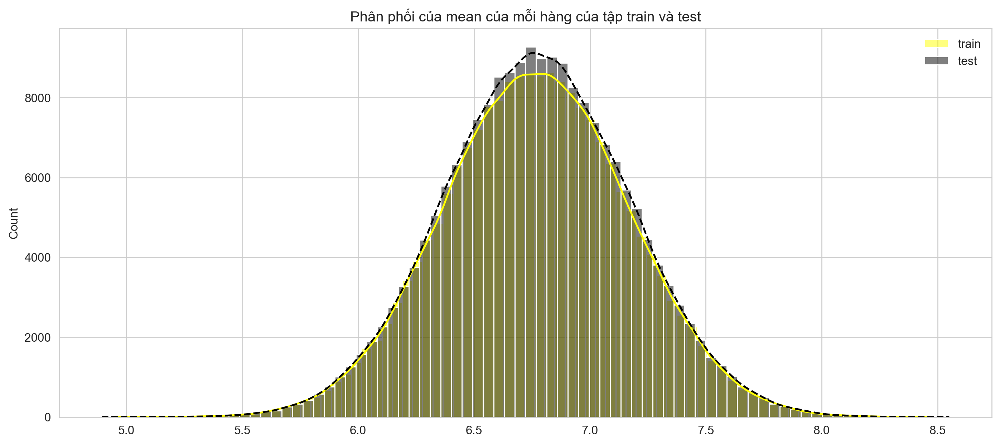

In [16]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))

plt.title("Phân phối của mean của mỗi hàng của tập train và test")
sns.histplot(train_df[features].mean(axis=1),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].mean(axis=1),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

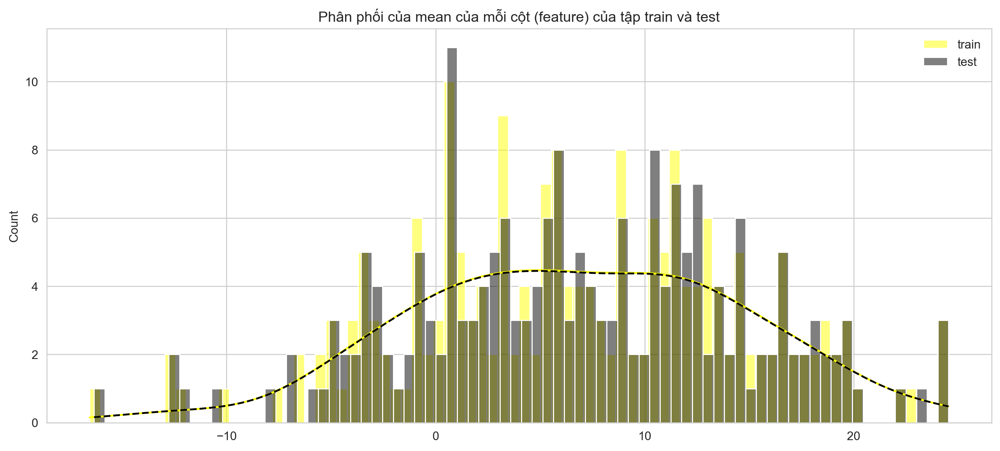

In [17]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của mean của mỗi cột (feature) của tập train và test")
sns.histplot(train_df[features].mean(axis=0),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].mean(axis=0),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

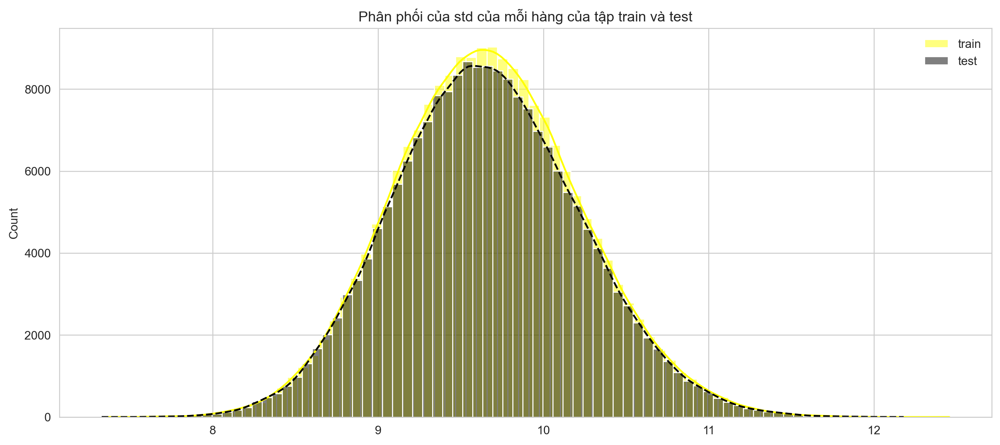

In [18]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của std của mỗi hàng của tập train và test")
sns.histplot(train_df[features].std(axis=1),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].std(axis=1),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

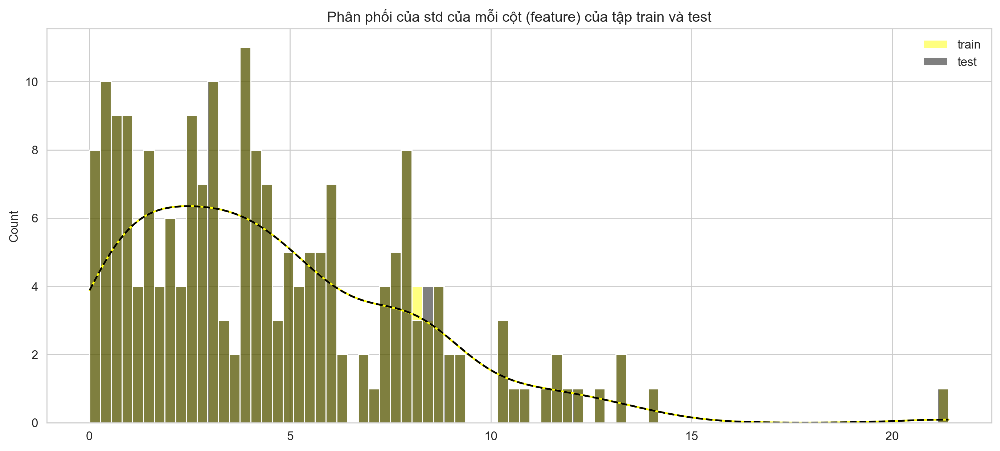

In [19]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của std của mỗi cột (feature) của tập train và test")
sns.histplot(train_df[features].std(axis=0),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].std(axis=0),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

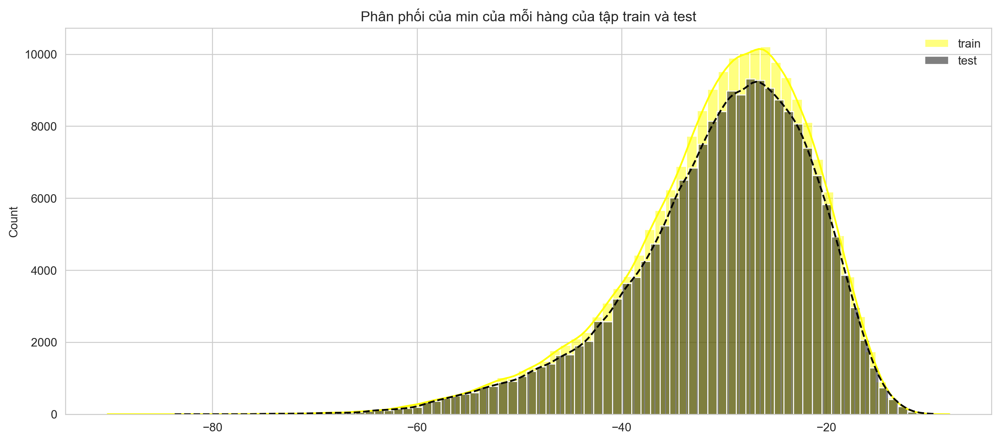

In [20]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của min của mỗi hàng của tập train và test")
sns.histplot(train_df[features].min(axis=1),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].min(axis=1),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

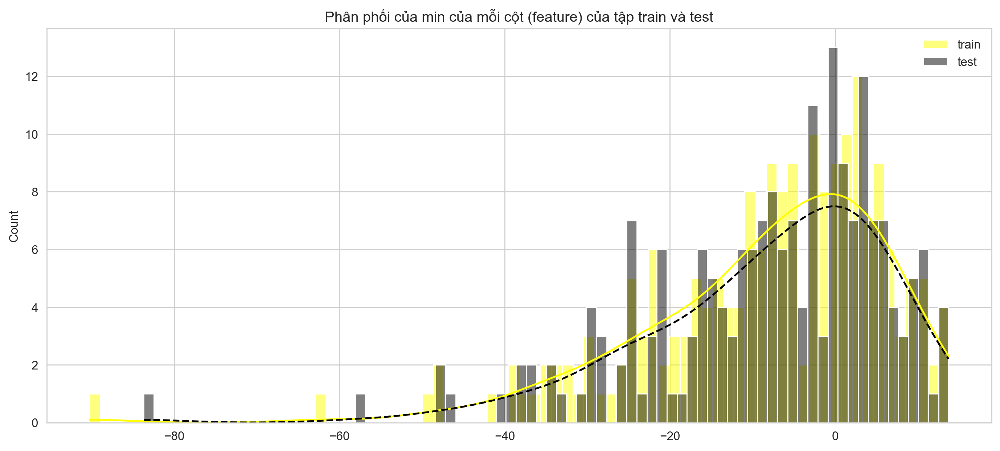

In [21]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của min của mỗi cột (feature) của tập train và test")
sns.histplot(train_df[features].min(axis=0),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].min(axis=0),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

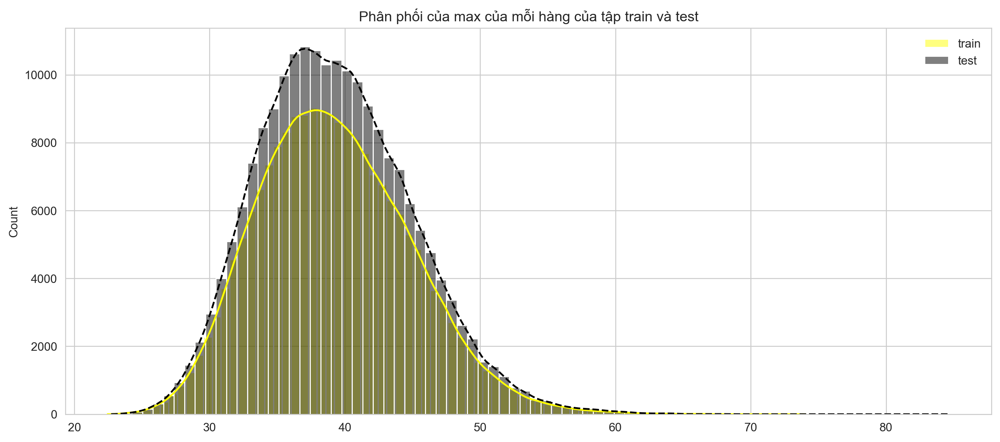

In [22]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của max của mỗi hàng của tập train và test")
sns.histplot(train_df[features].max(axis=1),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].max(axis=1),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

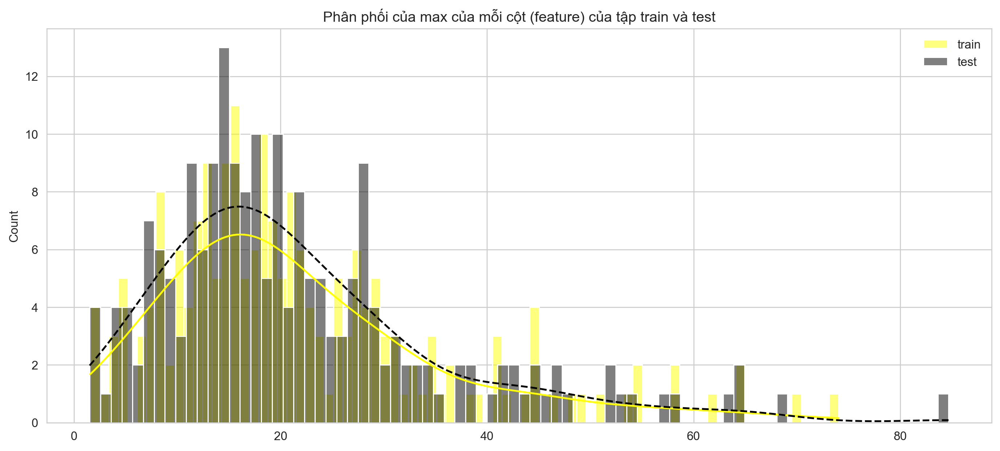

In [23]:
sns.set_style('whitegrid')
plt.figure(figsize=(14,6))
plt.title("Phân phối của max của mỗi cột (feature) của tập train và test")
sns.histplot(train_df[features].max(axis=0),color="yellow", kde=True,bins=80, label='train')
sns.histplot(test_df[features].max(axis=0),color="black", kde=True,bins=80, label='test')
plt.legend()
plt.show()

Ta có thể rút ra một số nhận xét sau:
* standard deviation khá lớn cho cả train và test.
* min, max, std, mean của train và test khá giống nhau.
* mean được phân phối dàn trên một khoảng lớn

## <a id='3.2'>3.2. Phân tích từng trường dữ liệu </a> 

#### Đầu tiên hãy phân tích về label "target" của tập train.

<Figure size 840x480 with 0 Axes>

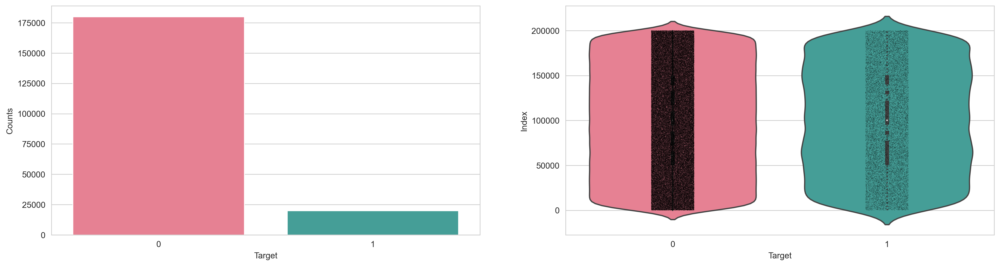

In [24]:
sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.countplot(train_df.target.values, ax=ax[0], palette="husl")
sns.violinplot(x=train_df.target.values, y=train_df.index.values, ax=ax[1], palette="husl")
sns.stripplot(x=train_df.target.values, y=train_df.index.values,
              jitter=True, ax=ax[1], color="black", size=0.5, alpha=0.5)
ax[1].set_xlabel("Target")
ax[1].set_ylabel("Index");
ax[0].set_xlabel("Target")
ax[0].set_ylabel("Counts");

In [25]:
print("Tổng số target = 0 là: ",train_df["target"].value_counts()[0])
print("Tổng số target = 1 là: ",train_df["target"].value_counts()[1])
print("Tổng số target = 1 chiếm {}% trong tất cả khách hàng.".format(100 * train_df["target"].value_counts()[1]/train_df.shape[0]))

Tổng số target = 0 là:  179902
Tổng số target = 1 là:  20098
Tổng số target = 1 chiếm 10.049% trong tất cả khách hàng.


Ta có một số nhận xét sau:
* Bài toán classification này không cân đối. Số khách mua hàng (target = 1) ít hơn hẳn so với số người không mua hàng (target = 0). Ta cần để ý điều này, về sau có thể dùng data augmentation (như SMOTE ...).
* Các khách hàng mua và không mua được phân bố đồng đều, không phụ thuộc vào index xuất hiện của chúng.

#### Bây giờ ta sẽ tìm hiểu về các features 

In [26]:
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,10,figsize=(18,22))

    for feature in features:
        i += 1
        plt.subplot(10,10,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=9)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
        plt.tick_params(axis='y', which='major', labelsize=6)
    plt.show();
    

Đầu tiên ta sẽ xem biểu đồ mật độ của 100 features đầu tiên (var_0 ~> var_99), sau đó là 100 features sau (var_100 -> var_199).

Đường màu xanh là target = 1, đường màu cam là target = 0.

<Figure size 840x480 with 0 Axes>

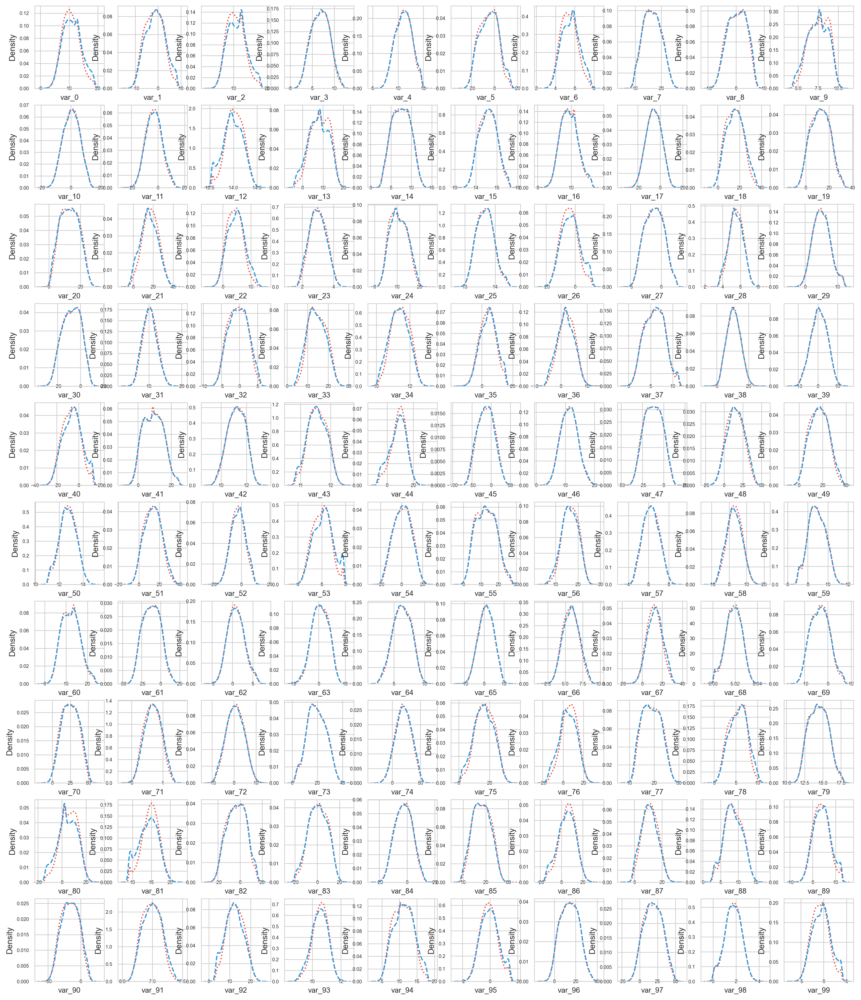

In [27]:
t0 = train_df.loc[train_df['target'] == 0]
t1 = train_df.loc[train_df['target'] == 1]
features = train_df.columns.values[2:102]
plot_feature_distribution(t0, t1, '0', '1', features)

<Figure size 840x480 with 0 Axes>

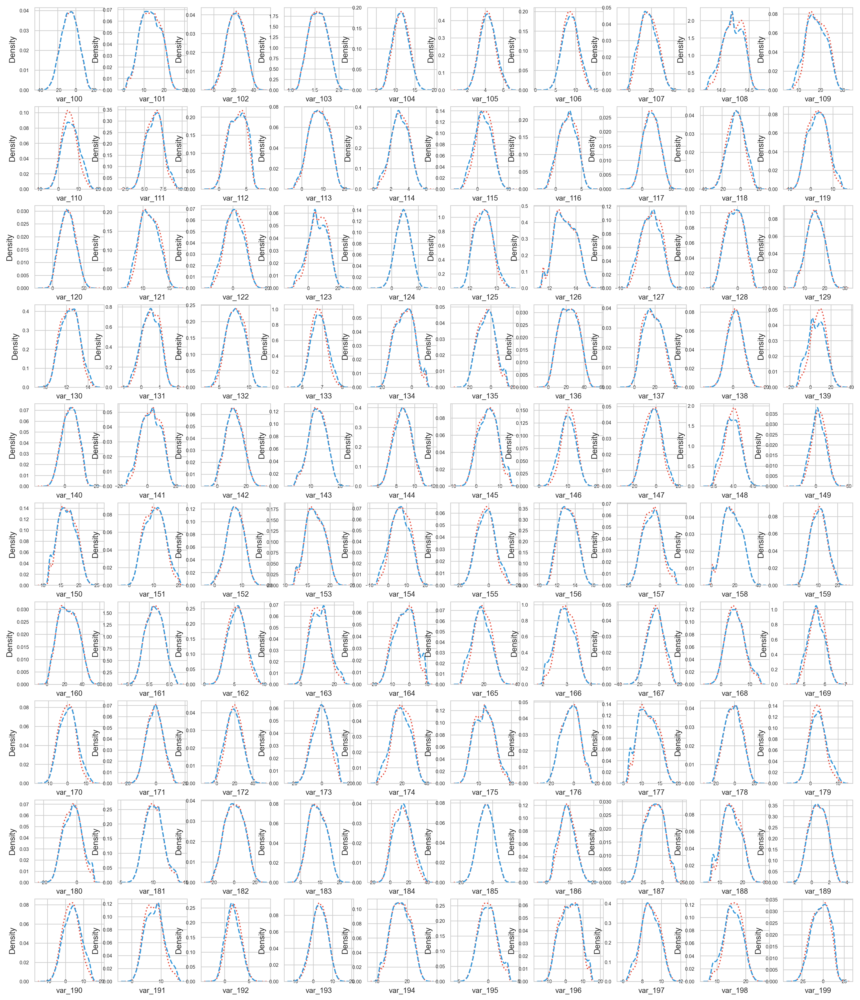

In [28]:
features = train_df.columns.values[102:202]
plot_feature_distribution(t0, t1, '0', '1', features)

Ta nhận thấy có một số feature có phân phối của target = 0 và target = 1 không đồng đều nhau như **var_0**, **var_1**, **var_2**, **var_9**, **var_12**, **var_13**, **var_110**, **var_139**...

Ta sẽ để ý đến những features này cân nhắc cho việc features selection. 

Bây giờ, ta hãy xem biểu đồ về phân bố của 200 features so sánh giữa tập train và test. (Xanh dương là test và cam là train)

<Figure size 840x480 with 0 Axes>

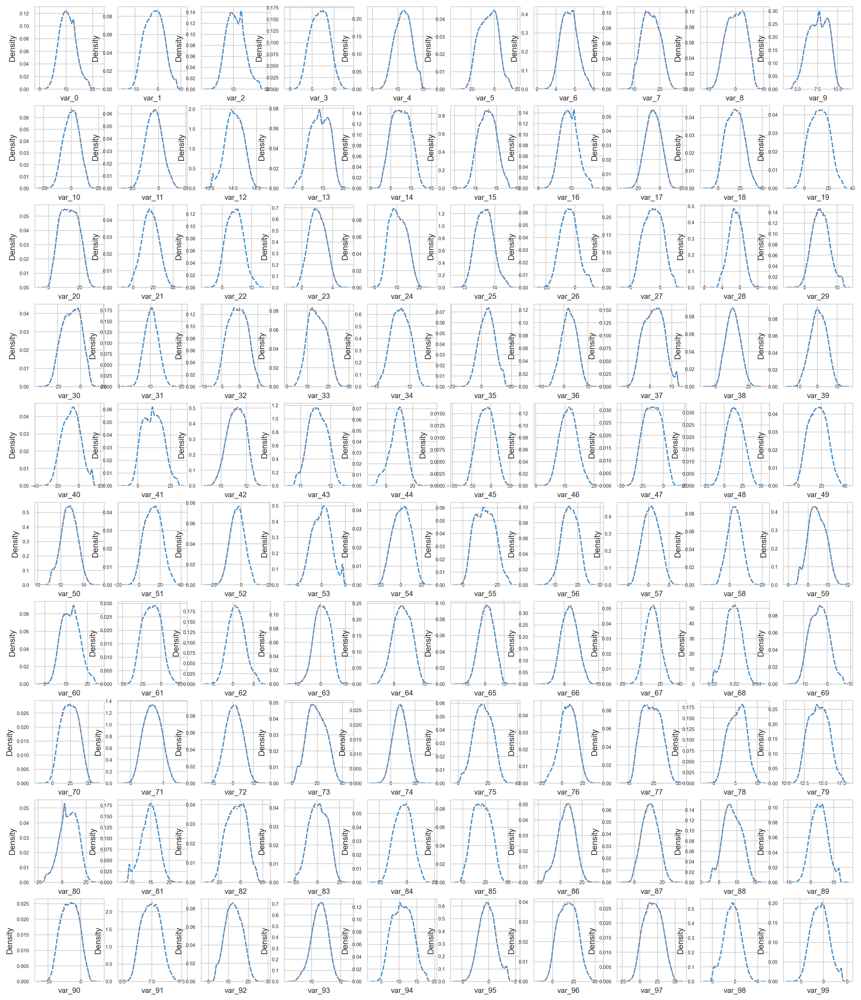

In [29]:
features = train_df.columns.values[2:102]
plot_feature_distribution(train_df, test_df, 'train', 'test', features)


<Figure size 840x480 with 0 Axes>

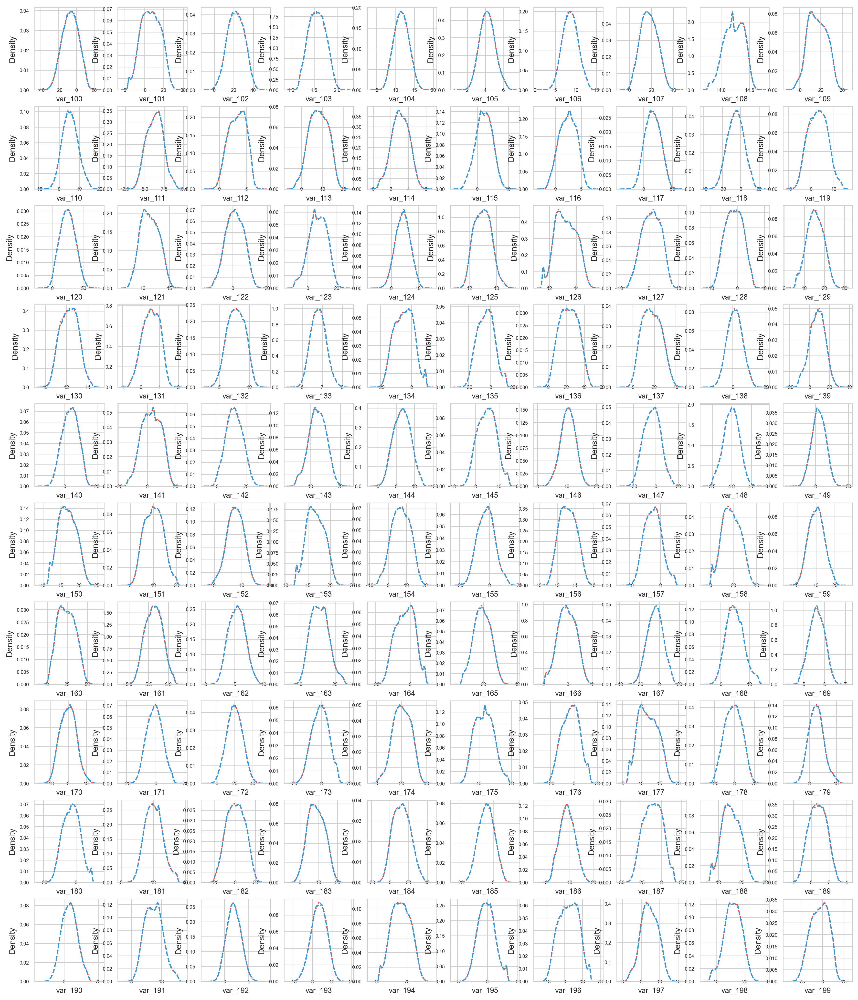

In [30]:
features = train_df.columns.values[102:202]
plot_feature_distribution(train_df, test_df, 'train', 'test', features)

Ta thấy train và test rất đồng đều nhau về phân phối của các features.

Bây giờ, ta sẽ kiểm tra các outliers của 200 trường var_0 ~> var_199

In [31]:
sns.set(style="whitegrid")
fig, ax1 = plt.subplots(10,10, figsize=(50,50))
k = 2
columns = list(train_df.columns)
for i in range(10):
    for j in range(10):
            sns.boxplot(train_df['target'], train_df[columns[k]], ax = ax1[i][j], palette='pastel')
            k += 1
plt.show()

In [32]:
sns.set(style="whitegrid")
fig, ax1 = plt.subplots(10,10, figsize=(50,50))
k = 102
columns = list(train_df.columns)
for i in range(10):
    for j in range(10):
            sns.boxplot(train_df['target'], train_df[columns[k]], ax = ax1[i][j], palette='pastel')
            k += 1
plt.show()

Ta thấy các trường của ta không có outliers nào thật sự nổi bật, dữ liệu được dàn trải khá cân đối.

## <a id='3.3'>3.3. Phân tích correlation giữa các trường dữ liệu </a> 

Đầu tiên, hãy xem về correlation giữa các cặp features với nhau.

In [33]:
correlations = train_df[features].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]
correlations.head(20)

,level_0,level_1,0
0,var_109,var_126,1.313947e-07
1,var_126,var_109,1.313947e-07
2,var_177,var_100,3.116544e-07
3,var_100,var_177,3.116544e-07
4,var_150,var_116,6.628008e-07
5,var_116,var_150,6.628008e-07
6,var_173,var_176,1.318335e-06
7,var_176,var_173,1.318335e-06
8,var_109,var_157,2.494615e-06
9,var_157,var_109,2.494615e-06


Ta sẽ xem 20 cặp features có correlation cao nhất.

In [34]:
correlations.tail(20)

,level_0,level_1,0
9880,var_191,var_166,0.007798
9881,var_166,var_191,0.007798
9882,var_137,var_180,0.007812
9883,var_180,var_137,0.007812
9884,var_121,var_149,0.007884
9885,var_149,var_121,0.007884
9886,var_195,var_148,0.007932
9887,var_148,var_195,0.007932
9888,var_167,var_173,0.008045
9889,var_173,var_167,0.008045


Ta sẽ xem 10 features có correlation cao nhất với label target của chúng ta.

Text(0, 0.5, 'Features')

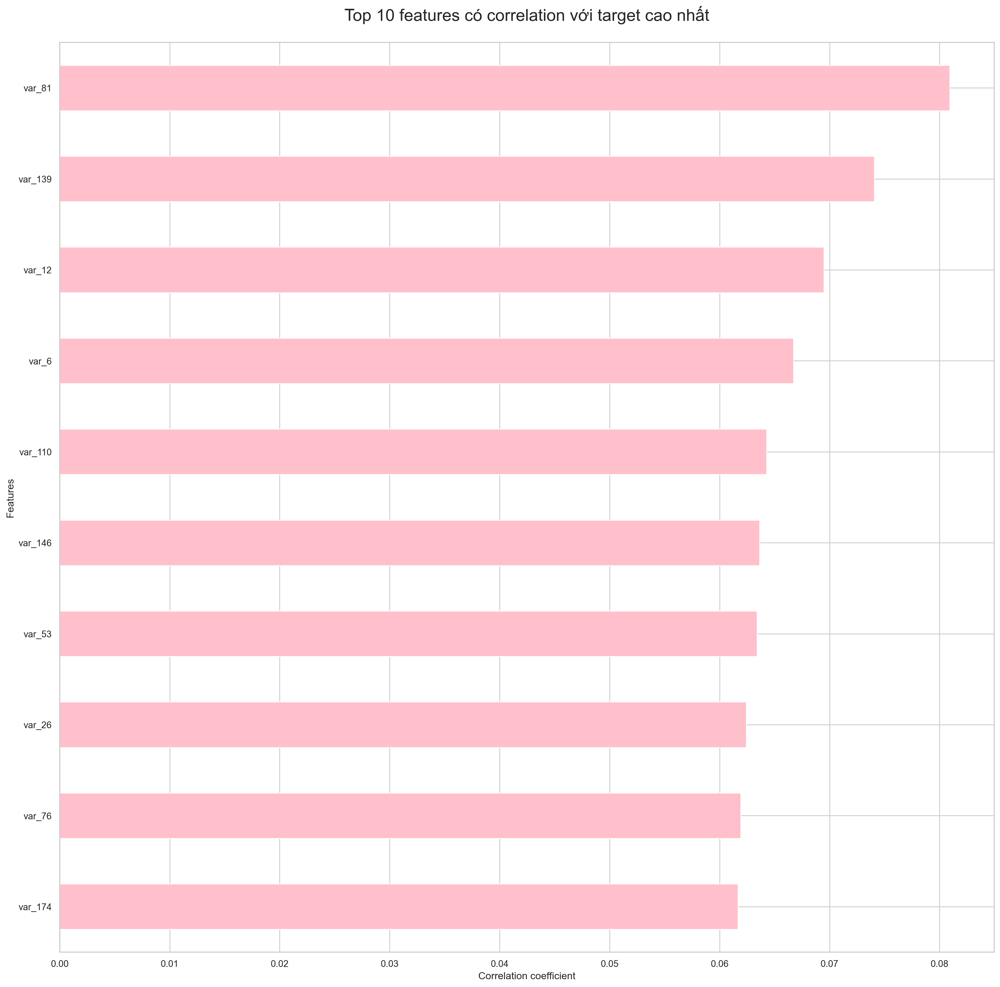

In [35]:
plt.figure(figsize=(20,20))
train_df.corr()['target'].apply(lambda x: abs(x)).sort_values(ascending=False).iloc[1:11][::-1].plot(kind='barh',color='pink') 
plt.title("Top 10 features có correlation với target cao nhất", size=20, pad=26)
plt.xlabel("Correlation coefficient")
plt.ylabel("Features")

Các correlation lại rất thấp. Hãy xem phân bố của correlation để có cái nhìn tổng quát hơn.

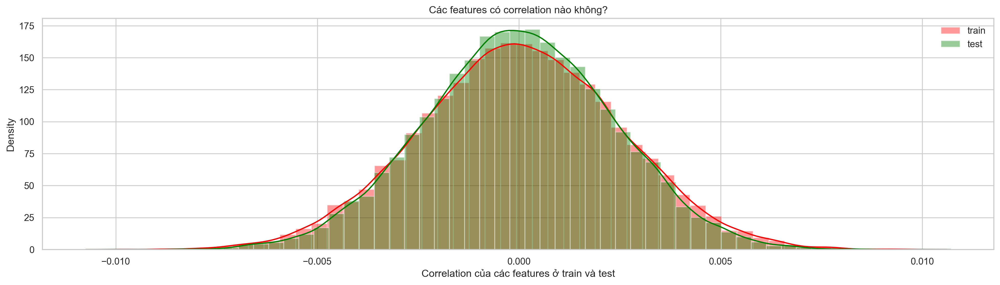

In [36]:
train_correlations = train_df.drop(["target"], axis=1).corr()
train_correlations = train_correlations.values.flatten()
train_correlations = train_correlations[train_correlations != 1]

test_correlations = test_df.corr()
test_correlations = test_correlations.values.flatten()
test_correlations = test_correlations[test_correlations != 1]

plt.figure(figsize=(20,5))
sns.distplot(train_correlations, color="Red", label="train")
sns.distplot(test_correlations, color="Green", label="test")
plt.xlabel("Correlation của các features ở train và test")
plt.ylabel("Density")
plt.title("Các features có correlation nào không?"); 
plt.legend();

Ta nhận xét ở cả tập train và test ta thấy mọi features gần như không có correlation nào, cũng như correlation giữa các features và label target cũng rất thấp.

# <a id='4'>4. Feature selection and Model building</a>

## <a id='4.1'>4.1. Một số Model cơ bản</a>

Ta sẽ build một số model đơn giản trực tiếp vào tập train, lấy model hiệu quá nhất để dùng để so sánh với những bước cải tiến model tiếp theo. Ta sẽ dùng Stratified K-Fold Cross Validation cho một số model như LGBM, XGBOOST, RandomForest,... 

In [4]:
def report_efficiency_of_model(y_true, y_pred):
    # Confusion matrix, precision, recall, f1-score, auc
    print("Roc auc score:", roc_auc_score(y_true, y_pred))
    idx = np.argsort(y_pred)
    threshold = int(len(y_true) * 0.8)
    new_y = y_true[idx]
    new_y_pred = np.concatenate((np.zeros(threshold, dtype = int), np.ones(len(y_true) - threshold, dtype = int)), axis = 0)
    print(classification_report(new_y, new_y_pred, labels=[0, 1]))
    print(pd.crosstab(new_y, new_y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True))

In [49]:
X_train_main, X_val_main, y_train_main, y_val_main = train_test_split(train_df.drop(['ID_code', 'target'], axis = 1), train_df['target'], test_size = 0.15, random_state = 42, stratify = train_df['target'])

In [65]:
# LBGM with Stratified K-fold
def runModel(X_train, y_train, X_val, test_df):
    features = X_train.columns
    lgbm_param = {
        'bagging_freq': 5,
        'bagging_fraction': 0.38, 
        'boost_from_average':'false',
        'boost': 'gbdt',
        'feature_fraction': 1.0,
        'learning_rate': 0.02,
        'max_depth': -1,  #-1
        'metric':'auc',
        'min_data_in_leaf': 20,
        'min_sum_hessian_in_leaf': 10.0, 
        'num_leaves': 3,
        'num_threads': 8,
        'tree_learner': 'serial',
        'objective': 'binary', 
        'verbosity': 1
    }
    num_round = 1000000
    folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 317)
    oof = np.zeros(len(X_train))
    predictions = np.zeros(len(test_df))
    y_val_main_pred = np.zeros(len(X_val))
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(X_train.values, y_train.values)):
        print("Fold {}".format(fold_))
        trn_data = lgb.Dataset(X_train.iloc[trn_idx], label = y_train.iloc[trn_idx])
        val_data = lgb.Dataset(X_train.iloc[val_idx], label = y_train.iloc[val_idx])
        clf = lgb.train(lgbm_param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3500)
        oof[val_idx] = clf.predict(X_train.iloc[val_idx], num_iteration=clf.best_iteration)
        predictions += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits
        y_val_main_pred += clf.predict(X_val, num_iteration=clf.best_iteration) / folds.n_splits
    print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))
    return predictions, y_val_main_pred

In [66]:
predictions, y_val_main_pred = runModel(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':predictions}).to_csv("submission_basicModel.csv", index=False)

Fold 0
[LightGBM] [Info] Number of positive: 13667, number of negative: 122333
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078481 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 51000
[LightGBM] [Info] Number of data points in the train set: 136000, number of used features: 200
Training until validation scores don't improve for 3500 rounds
[1000]	training's auc: 0.863223	valid_1's auc: 0.856108
[2000]	training's auc: 0.889427	valid_1's auc: 0.878797
[3000]	training's auc: 0.900819	valid_1's auc: 0.888357
[4000]	training's auc: 0.907512	valid_1's auc: 0.893085
[5000]	training's auc: 0.911767	valid_1's auc: 0.896003
[6000]	training's auc: 0.915022	valid_1's auc: 0.8972
[7000]	training's auc: 0.917584	valid_1's auc: 0.897929
[8000]	training's auc: 0.919779	valid_1's auc: 0.897866
[9000]	training's auc: 0.921835	valid_1's auc: 0.89764
[10000]	training's auc: 0.923826	valid_1's auc: 0.897492
Early

In [67]:
report_efficiency_of_model(y_val_main.values, y_val_main_pred)

Roc auc score: 0.8977539822350787
              precision    recall  f1-score   support

           0       0.97      0.86      0.91     26985
           1       0.39      0.77      0.52      3015

    accuracy                           0.85     30000
   macro avg       0.68      0.82      0.71     30000
weighted avg       0.91      0.85      0.87     30000

Predicted      0     1    All
Actual                       
0          23308  3677  26985
1            692  2323   3015
All        24000  6000  30000


Chấm kết quả **submission_basicModel.csv** được 0.90026 roc_auc_score khi dùng LGBM.

In [51]:
# XGBOOST with Stratified K-fold
def runModelXGBOOST(X_train, y_train, X_val, test_df):
    oof = np.zeros(X_train.shape[0])
    pred = np.zeros(test_df.shape[0])
    y_val_main_pred = np.zeros(len(X_val))
    x = X_train.values
    y = y_train.values
    folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)
    model_xgb =  xgb.XGBClassifier(
        max_depth=3,
        colsample_bytree=0.7,
        n_estimators=20000,
        scale_pos_weight = 9,
        learning_rate=0.02,
        objective='binary:logistic', 
        verbosity =1,
        eval_metric  = 'auc',
        tree_method='hist',
        n_jobs=-1
    )
    for fold_index, (train_index,val_index) in enumerate(folds.split(x,y)):
        print('Fold {}'.format(fold_index))
        bst = model_xgb.fit(x[train_index],y[train_index],
                  eval_set = [(x[val_index],y[val_index])],
                  early_stopping_rounds=200,
                  verbose= 200, 
                  eval_metric ='auc'
                  )
        oof[val_index] = model_xgb.predict_proba(x[val_index])[:,1]
        pred += model_xgb.predict_proba(test_df.drop(['ID_code'], axis = 1).values)[:,1] / folds.n_splits
        y_val_main_pred += model_xgb.predict_proba(X_val.values)[:,1] / folds.n_splits
    print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))
    return pred, y_val_main_pred

In [52]:
predictions, y_val_main_pred = runModelXGBOOST(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':predictions}).to_csv("submission_basicModel1.csv", index=False)

Fold 0
[0]	validation_0-auc:0.58395
[200]	validation_0-auc:0.79271
[400]	validation_0-auc:0.82789
[600]	validation_0-auc:0.84567
[800]	validation_0-auc:0.85639
[1000]	validation_0-auc:0.86392
[1200]	validation_0-auc:0.86934
[1400]	validation_0-auc:0.87396
[1600]	validation_0-auc:0.87775
[1800]	validation_0-auc:0.88046
[2000]	validation_0-auc:0.88270
[2200]	validation_0-auc:0.88456
[2400]	validation_0-auc:0.88635
[2600]	validation_0-auc:0.88768
[2800]	validation_0-auc:0.88898
[3000]	validation_0-auc:0.88995
[3200]	validation_0-auc:0.89079
[3400]	validation_0-auc:0.89130
[3600]	validation_0-auc:0.89190
[3800]	validation_0-auc:0.89239
[4000]	validation_0-auc:0.89288
[4200]	validation_0-auc:0.89319
[4400]	validation_0-auc:0.89353
[4600]	validation_0-auc:0.89375
[4800]	validation_0-auc:0.89391
[5000]	validation_0-auc:0.89402
[5200]	validation_0-auc:0.89417
[5400]	validation_0-auc:0.89425
[5600]	validation_0-auc:0.89431
[5800]	validation_0-auc:0.89445
[6000]	validation_0-auc:0.89448
[6200]	v

In [53]:
report_efficiency_of_model(y_val_main.values, y_val_main_pred)

Roc auc score: 0.8938199988876565
              precision    recall  f1-score   support

           0       0.97      0.86      0.91     26985
           1       0.38      0.76      0.51      3015

    accuracy                           0.85     30000
   macro avg       0.68      0.81      0.71     30000
weighted avg       0.91      0.85      0.87     30000

Predicted      0     1    All
Actual                       
0          23280  3705  26985
1            720  2295   3015
All        24000  6000  30000


Chấm kết quả **submission_basicModel1.csv** được 0.89624 roc_auc_score khi dùng XGBOOST.

In [62]:
# RandomForestClassifier with Stratified K-fold
def runModelRFC(X_train, y_train, X_val, test_df):
    features = X_train.columns
    clf = RandomForestClassifier(
        n_estimators = 100,
        criterion = 'gini',
        max_depth = 7,
        min_samples_split = 2,
        min_samples_leaf = 1,
        min_weight_fraction_leaf = 0.0,
        max_features = 'auto',
        max_leaf_nodes = None,
        min_impurity_decrease = 0.0,
        min_impurity_split = None,
        bootstrap = True,
        oob_score = False,
        n_jobs = -1,
        random_state = 42,
        verbose = 0,
        warm_start = False,
        class_weight ='balanced'
    )
    num_round = 1000000
    folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 317)
    oof = np.zeros(len(X_train))
    predictions = np.zeros(len(test_df))
    y_val_main_pred = np.zeros(len(X_val))
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(X_train.values, y_train.values)):
        print("Fold {}".format(fold_))
        clf.fit(X_train.iloc[trn_idx], y_train.iloc[trn_idx])
        oof[val_idx] = clf.predict(X_train.iloc[val_idx])
        predictions += clf.predict(test_df[features]) / folds.n_splits
        y_val_main_pred += clf.predict(X_val) / folds.n_splits
    print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))
    return predictions, y_val_main_pred

In [63]:
predictions, y_val_main_pred = runModelRFC(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':predictions}).to_csv("submission_basicModel2.csv", index=False)

Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
CV score: 0.70602 


In [64]:
report_efficiency_of_model(y_val_main.values, y_val_main_pred)

Roc auc score: 0.742058504955305
              precision    recall  f1-score   support

           0       0.94      0.84      0.89     26985
           1       0.28      0.55      0.37      3015

    accuracy                           0.81     30000
   macro avg       0.61      0.70      0.63     30000
weighted avg       0.88      0.81      0.84     30000

Predicted      0     1    All
Actual                       
0          22658  4327  26985
1           1342  1673   3015
All        24000  6000  30000


Chấm kết quả **submission_basicModel2.csv** được 0.74778 roc_auc_score khi dùng Random Forest Classifier.

Ta thấy model LightGBM chạy nhanh, hiệu quả hơn 2 model còn lại. Từ đây, ta sẽ sử dụng LightGBM để thử nghiệm các cải tiến với model. 

## <a id='4.2'>4.2. Một số thử nghiệm để cải tiến model</a>

### Thử nghiệm Augment Data bằng SMOTE

In [82]:
from imblearn.over_sampling import SMOTE
def augmentData(X, y, augment = 0):
    if (augment == 0): # Sử dụng SMOTE     
        oversample = SMOTE()
        X, y = oversample.fit_resample(X, y)
        return X, y

In [85]:
def runModelWithAugmentation(X_train, y_train, X_val, test_df, augment = 0):
    features = X_train.columns
    lgbm_param = {
        'bagging_freq': 5,
        'bagging_fraction': 0.38, 
        'boost_from_average':'false',
        'boost': 'gbdt',
        'feature_fraction': 0.045,
        'learning_rate': 0.0095,
        'max_depth': -1,  #-1
        'metric':'auc',
        'min_data_in_leaf': 20,
        'min_sum_hessian_in_leaf': 10.0, 
        'num_leaves': 3,
        'num_threads': 8,
        'tree_learner': 'serial',
        'objective': 'binary', 
        'verbosity': 1
    }
    num_round = 1000000
    folds = StratifiedKFold(n_splits = 5, shuffle = False)
    oof = np.zeros(len(X_train))
    predictions = np.zeros(len(test_df))
    y_val_main_pred = np.zeros(len(X_val))
    for fold_, (trn_idx, val_idx) in enumerate(folds.split(X_train.values, y_train.values)):
        print("Fold {}".format(fold_))
        X_train_1, y_train_1 = X_train.iloc[trn_idx], y_train.iloc[trn_idx]
        X_valid, y_valid = X_train.iloc[val_idx], y_train.iloc[val_idx]
        X_t, y_t = augmentData(X_train.values, y_train.values, augment)
        X_t = pd.DataFrame(X_t)
        X_t = X_t.add_prefix('var_')
        
        trn_data = lgb.Dataset(X_t, label=y_t)
        val_data = lgb.Dataset(X_valid, label=y_valid)
        clf = lgb.train(lgbm_param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3500)
        oof[val_idx] = clf.predict(X_train.iloc[val_idx], num_iteration=clf.best_iteration)
        predictions += clf.predict(test_df[features], num_iteration=clf.best_iteration) / folds.n_splits
        y_val_main_pred += clf.predict(X_val, num_iteration=clf.best_iteration) / folds.n_splits
    print("CV score: {:<8.5f}".format(roc_auc_score(target, oof)))
    return predictions, y_val_main_pred

In [86]:
predictions, y_val_main_pred = runModelWithAugmentation(X_train_main, y_train_main, X_val_main, test_df, 0) # 0 nghĩa là sử dụng SMOTE để augment data
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':predictions}).to_csv("submission_AugmentBasicModel.csv", index=False)

Fold 0
[LightGBM] [Info] Number of positive: 134926, number of negative: 134926
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 51000
[LightGBM] [Info] Number of data points in the train set: 269852, number of used features: 200
Training until validation scores don't improve for 3500 rounds
[1000]	training's auc: 0.896764	valid_1's auc: 0.681021
[2000]	training's auc: 0.916817	valid_1's auc: 0.70401
[3000]	training's auc: 0.926398	valid_1's auc: 0.717367
[4000]	training's auc: 0.932332	valid_1's auc: 0.727786
[5000]	training's auc: 0.936537	valid_1's auc: 0.736478
[6000]	training's auc: 0.939723	valid_1's auc: 0.743784
[7000]	training's auc: 0.942473	valid_1's auc: 0.751751
[8000]	training's auc: 0.944694	valid_1's auc: 0.758016
[9000]	training's auc: 0.946543	valid_1's auc: 0.76

KeyboardInterrupt: 

Sau khi sử dụng SMOTE để augment tập train và đánh giá trên tập valid, ngay khi vừa chạy **Fold 0**, ta đã thấy **training's auc** cao hơn so với khi chưa augment data, nhưng **valid_1's auc** lại rất thấp so với khi chưa augment trong khi model LBGM đã được tuning khá nhiều để tránh overfiting. Ta nhận xét rằng model đã bị overfit rất nặng và oversampling dường như không phải là một phương án hay để cải tiến data. Điều này cũng chỉ rằng undersampling cũng sẽ không cải tiến data đáng kể. 

Để kiểm chứng cho assumption trên thì ta sẽ xem train data của ta bằng UMAP (Uniform Manifold Approximation and Projection for Dimension Reduction).

<img src="UMAP.png">

Thông thường, oversampling hay undersampling sẽ có hiệu quả cao khi data đã có một sự phân chia nào đó đối với các label. Nên khi ta oversampling hay undersampling thì ta đang cố giúp model nhận diện rõ hơn sự phân biệt đó để tăng sự chính xác. 

Còn như data của bài này ta thấy 2 label 0 và 1 dàn trải và trộn lẫn đồng đều vào nhau. Việc oversampling hay undersampling sẽ chỉ tạo thêm noise cho data, có thể nó sẽ giúp nhưng sẽ không thực sự hiệu quả.

### Thử nghiệm Lasso (L1) cho features selection

In [45]:
def lassoFE(train_df, C):
    X, y = train_df.drop(['target', 'ID_code'], axis = 1), train_df['target']
    sel_ = SelectFromModel(LogisticRegression(C = C, penalty='l1', solver='liblinear'))
    sel_.fit(X, y)
    print(sel_.get_support())

In [46]:
lassoFE(train_df, 1)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  T

Đã thử nhiều giá trị **C** khác nhau (lên tới 500) của Lasso (L1) nhưng không có một features nào shrink về 0. Điều này càng chứng tỏ mỗi features đóng góp một phần nhỏ vào kết quả và không có features nào là thực sự quan trọng, nổi bật.

### Thử nghiệm chạy model trên những features có distribution giữa 2 target có phần khác nhau

In [69]:
def runOnSubsetOfFeatures(train_df, test_df):
    chooseFeatures = ['var_0', 'var_1', 'var_2', 'var_5', 'var_6', 'var_9', 'var_12', 'var_13', 'var_18', 'var_20', 'var_21', 'var_22', 'var_24', 'var_26', 'var_28', 'var_32', 'var_33', 'var_34' \
    , 'var_35', 'var_36', 'var_40', 'var_43', 'var_44', 'var_45', 'var_48', 'var_49', 'var_50', 'var_51', 'var_52', 'var_53', 'var_55', 'var_56', 'var_58', 'var_60', 'var_61' \
    , 'var_62', 'var_67', 'var_68', 'var_75', 'var_76', 'var_77', 'var_78', 'var_80', 'var_81', 'var_82', 'var_83', 'var_85', 'var_86', 'var_87', 'var_88', 'var_89' \
    , 'var_91', 'var_92', 'var_93', 'var_94', 'var_95', 'var_98', 'var_99', 'var_101', 'var_106', 'var_107', 'var_108', 'var_109', 'var_110', 'var_112', 'var_115' \
    , 'var_116', 'var_119', 'var_122', 'var_123', 'var_125', 'var_127', 'var_130', 'var_131', 'var_133', 'var_135', 'var_139', 'var_141', 'var_145', 'var_146'\
    , 'var_148', 'var_149', 'var_150', 'var_151', 'var_154', 'var_155', 'var_157', 'var_163', 'var_164', 'var_165', 'var_166', 'var_169', 'var_170', 'var_173'\
    , 'var_174', 'var_175', 'var_177', 'var_179', 'var_180', 'var_184', 'var_188', 'var_190', 'var_191', 'var_198']
    new_test_df = test_df[chooseFeatures]
    new_X_train = X_train_main[chooseFeatures]
    runModel(new_X_train, y_train_main, X_val_main[chooseFeatures], new_test_df)

In [70]:
runOnSubsetOfFeatures(train_df, test_df)

Fold 0
[LightGBM] [Info] Number of positive: 2976, number of negative: 27024
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008805 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 26520
[LightGBM] [Info] Number of data points in the train set: 30000, number of used features: 104
Training until validation scores don't improve for 3500 rounds
[1000]	training's auc: 0.874688	valid_1's auc: 0.847953
[2000]	training's auc: 0.899332	valid_1's auc: 0.86555
[3000]	training's auc: 0.9101	valid_1's auc: 0.871901
[4000]	training's auc: 0.917955	valid_1's auc: 0.872046
[5000]	training's auc: 0.925086	valid_1's auc: 0.872418
[6000]	training's auc: 0.931519	valid_1's auc: 0.871261
[7000]	training's auc: 0.938071	valid_1's auc: 0.869709
[8000]	training's auc: 0.942899	valid_1's auc: 0.869442
Early stopping, best iteration is:
[5296]	training's auc: 0.927082	valid_1's auc: 0.872888
Fold 1
[LightGBM] [Info] Numbe

Ta nhận thấy chạy model trên một subset features thì kết quả không cải tiến mà còn kém đi.

Điều này dường như cũng đoán trước được do các features và label không có correlation nào nổi bật và cả Lasso cũng đã confirm điều này.

Ta kết luận việc chỉ dùng một subset features nào đó thì sẽ không hiệu quả.

Tiếp đến ta sẽ thử nghiệm thêm một số features mới.

### Thử nghiệm thêm một số features mới

Các features có correlation với nhau rất thấp nên khi tạo features mới ta sẽ tạo thêm data với mỗi feature thay vì là quan hệ giữa các features với nhau.

Vì số lượng unique values ở mỗi feature khác biệt nhau rất lớn giữa tập train và test nên ta sẽ thử với mỗi feature **var_i** ta sẽ add thêm một feature **var_i_count** tương ứng là số lần xuất hiện của giá trị đó trong cột **var_i** (sau khi gộp cả test và train). Tổng cộng ta sẽ có 400 features.

In [7]:
def addCountFeatures(train_df, test_df, colName):
    cv = train_df[colName].value_counts()
    newCol = colName + '_count'
    train_df[newCol] = train_df[colName].map(cv)
    test_df[newCol] = test_df[colName].map(cv)
    if cv.max() <= 255:
        train_df[newCol] = train_df[newCol].astype('uint8')
        test_df[newCol] = test_df[newCol].astype('uint8')
    else:
        train_df[newCol] = train_df[newCol].astype('uint16')
        test_df[newCol] = test_df[newCol].astype('uint16')        
    return

test_df['target'] = -1
tot = pd.concat([train_df, test_df], axis = 0, sort = True)
for i in range(200): addCountFeatures(tot, test_df, 'var_' + str(i))
train_df = tot[:len(train_df)]; del tot

In [8]:
train_df.head()

,ID_code,target,var_0,var_1,var_10,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_11,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_12,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_13,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_14,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_15,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_16,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_17,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_18,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_19,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_2,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_3,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_4,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_5,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_6,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_7,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_8,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_9,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,var_175_count,var_176_count,var_177_count,var_178_count,var_179_count,var_180_count,var_181_count,var_182_count,var_183_count,var_184_count,var_185_count,

In [9]:
test_df.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,target,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,var_175_count,var_176_count,var_177_count,var_178_count,var_179_count,var_180_count,var_181_count,var_182_count,var_183_count,var_184_count,var_185_count,

In [10]:
X_train_main, X_val_main, y_train_main, y_val_main = train_test_split(train_df.drop(['ID_code', 'target'], axis = 1), train_df['target'], test_size = 0.15, random_state = 42, stratify = train_df['target'])

In [11]:
predictions, y_val_main_pred = runModel(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':predictions}).to_csv("submission_basicModel.csv", index=False)

Fold 0
[LightGBM] [Info] Number of positive: 13667, number of negative: 122333
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.154613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 57141
[LightGBM] [Info] Number of data points in the train set: 136000, number of used features: 400
Training until validation scores don't improve for 3500 rounds
[1000]	training's auc: 0.86462	valid_1's auc: 0.857658
[2000]	training's auc: 0.891267	valid_1's auc: 0.881025
[3000]	training's auc: 0.903446	valid_1's auc: 0.891269
[4000]	training's auc: 0.910871	valid_1's auc: 0.89688
[5000]	training's auc: 0.915791	valid_1's auc: 0.900589
[6000]	training's auc: 0.919691	valid_1's auc: 0.902427
[7000]	training's auc: 0.922955	valid_1's auc: 0.903976
[8000]	training's auc: 0.9257	valid_1's auc: 0.904547
[9000]	training's auc: 0.928193	valid_1's auc: 0.904728
[10000]	training's auc: 0.930429	valid_1's auc: 0.905147
[11000

In [12]:
report_efficiency_of_model(y_val_main.values, y_val_main_pred)

Roc auc score: 0.9053274667979354
              precision    recall  f1-score   support

           0       0.97      0.87      0.92     26985
           1       0.39      0.79      0.53      3015

    accuracy                           0.86     30000
   macro avg       0.68      0.83      0.72     30000
weighted avg       0.91      0.86      0.88     30000

Predicted      0     1    All
Actual                       
0          23352  3633  26985
1            648  2367   3015
All        24000  6000  30000


Kết quả có cải tiến tuy là không nhiều. Chấm kết quả **submission_added200Fe.csv** được 0.90179 roc_auc_score, tốt hơn so với 0.90026 khi chưa thêm 200 features mới.

### Thử nghiệm chạy LBGM trên mỗi cặp features và gộp kết quả

Do 200 features (**var_0** -> **var_199**) của ta khá là independent với nhau, nên ta sẽ thử nghiệm chạy LBGM Stratified K-Fold với mỗi cặp **var_i** và **var_i_count** sau đó gộp kết quả của 200 cặp này bằng cách lấy tổng.

In [17]:
def run_model_on_pair(X_train, y_train, X_val, test_df):
    param = {
       'bagging_fraction': 0.7693,
       'bagging_freq': 2,
       'lambda_l1': 0.7199,
       'lambda_l2': 1.992,
       'learning_rate': 0.009455,
       'max_depth': 3,
       'min_data_in_leaf': 22,
       'min_gain_to_split': 0.06549,
       'min_sum_hessian_in_leaf': 18.55,
       'num_leaves': 20,
       'feature_fraction': 1,
       'save_binary': True,
       'seed': 317,
       'feature_fraction_seed': 317,
       'bagging_seed': 317,
       'drop_seed': 317,
       'data_random_seed': 317,
       'objective': 'binary',
       'boosting_type': 'gbdt',
       'verbosity': -1,
       'metric': 'auc',
       'is_unbalance': True,
       'boost_from_average': 'false',
       'num_threads': 6}

    features = X_train.columns

    folds = StratifiedKFold(n_splits = 4, shuffle = True, random_state=42)
    y_pred = np.zeros([len(X_val), 200])
    test_pred = np.zeros([len(test_df), 200])
    i = 0
    for feature in ['var_' + str(x) for x in range(200)]: # loop over all features
        print("Build LGBM Model on:", feature, " and", feature + '_count')
        feat_choices = [feature, feature + '_count']
        oof = np.zeros(len(X_train))
        predictions = np.zeros(len(test_df))
        y_val_pred = np.zeros(len(X_val))
        for fold_, (trn_idx, val_idx) in enumerate(folds.split(X_train[feat_choices].values, y_train.values)):
            #print("Fold :{}".format(fold_ + 1))
            trn_data = lgb.Dataset(X_train.iloc[trn_idx][feat_choices], label = y_train.iloc[trn_idx])
            val_data = lgb.Dataset(X_train.iloc[val_idx][feat_choices], label = y_train.iloc[val_idx])
            clf = lgb.train(param, trn_data, 126, valid_sets = [trn_data, val_data], verbose_eval=-1)
            oof[val_idx] = clf.predict(X_train.iloc[val_idx][feat_choices], num_iteration=clf.best_iteration)
            predictions += clf.predict(test_df[feat_choices], num_iteration=clf.best_iteration) / folds.n_splits
            y_val_pred += clf.predict(X_val[feat_choices], num_iteration=clf.best_iteration) / folds.n_splits
        print("CV score: {:<8.5f}".format(roc_auc_score(y_train, oof)))

        y_pred[:, i] = y_val_pred
        test_pred[:, i] = predictions
        i += 1
    return (y_pred).sum(axis = 1), (test_pred).sum(axis = 1)

In [18]:
y_pred1, test_pred1 = run_model_on_pair(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':test_pred1}).to_csv("submission_pairFeatureTrain.csv", index=False)

Build LGBM Model on: var_0  and var_0_count
CV score: 0.54975 
Build LGBM Model on: var_1  and var_1_count
CV score: 0.54441 
Build LGBM Model on: var_2  and var_2_count
CV score: 0.55192 
Build LGBM Model on: var_3  and var_3_count
CV score: 0.50598 
Build LGBM Model on: var_4  and var_4_count
CV score: 0.50159 
Build LGBM Model on: var_5  and var_5_count
CV score: 0.52787 
Build LGBM Model on: var_6  and var_6_count
CV score: 0.55836 
Build LGBM Model on: var_7  and var_7_count
CV score: 0.50236 
Build LGBM Model on: var_8  and var_8_count
CV score: 0.51603 
Build LGBM Model on: var_9  and var_9_count
CV score: 0.54298 
Build LGBM Model on: var_10  and var_10_count
CV score: 0.50005 
Build LGBM Model on: var_11  and var_11_count
CV score: 0.51914 
Build LGBM Model on: var_12  and var_12_count
CV score: 0.55932 
Build LGBM Model on: var_13  and var_13_count
CV score: 0.55343 
Build LGBM Model on: var_14  and var_14_count
CV score: 0.50612 
Build LGBM Model on: var_15  and var_15_count

CV score: 0.52106 
Build LGBM Model on: var_126  and var_126_count
CV score: 0.49885 
Build LGBM Model on: var_127  and var_127_count
CV score: 0.53651 
Build LGBM Model on: var_128  and var_128_count
CV score: 0.52316 
Build LGBM Model on: var_129  and var_129_count
CV score: 0.49802 
Build LGBM Model on: var_130  and var_130_count
CV score: 0.52523 
Build LGBM Model on: var_131  and var_131_count
CV score: 0.52971 
Build LGBM Model on: var_132  and var_132_count
CV score: 0.52245 
Build LGBM Model on: var_133  and var_133_count
CV score: 0.54539 
Build LGBM Model on: var_134  and var_134_count
CV score: 0.51200 
Build LGBM Model on: var_135  and var_135_count
CV score: 0.52344 
Build LGBM Model on: var_136  and var_136_count
CV score: 0.50165 
Build LGBM Model on: var_137  and var_137_count
CV score: 0.52439 
Build LGBM Model on: var_138  and var_138_count
CV score: 0.51349 
Build LGBM Model on: var_139  and var_139_count
CV score: 0.57684 
Build LGBM Model on: var_140  and var_140_c

In [19]:
report_efficiency_of_model(y_val_main.values, y_pred1)

Roc auc score: 0.9205800286443763
              precision    recall  f1-score   support

           0       0.98      0.87      0.92     26985
           1       0.41      0.82      0.55      3015

    accuracy                           0.86     30000
   macro avg       0.69      0.84      0.73     30000
weighted avg       0.92      0.86      0.88     30000

Predicted      0     1    All
Actual                       
0          23445  3540  26985
1            555  2460   3015
All        24000  6000  30000


Ta dễ dàng thấy một sự tối ưu đáng kể về mặt thời gian chạy model. 
Không những thế, sự chính xác cũng tăng lên một phần. Chấm kết quả **submission_pairFeatureTrain.csv** được 0.90228 roc_auc_score, tốt hơn so với 0.90179 trước đó.

### Loại bỏ fake test trong tập test

Nhờ vào notebook tuyệt vời <a href='https://www.kaggle.com/yag320/list-of-fake-samples-and-public-private-lb-split'> List of Fake Samples and Public/Private LB split </a>, ta có thể tách được những fake samples được tạo ra trong tập test. 

Tóm tắt quá trình họ phân loại được fake samples: Dựa vào việc statistics của tập train và test khá giống nhau, trong khi distribution của số lượng unique value ở mỗi feature thì lại rất khác nhau giữa train và test, họ đã assume những fake samples được tạo ra bằng cách sampling các real samples feature distribution. Sau đó, kiểm tra mỗi sample nếu có một giá trị là unique value ở cột feature tương ứng thì sample đó là real, còn lại là fake.


In [20]:
from tqdm import tqdm_notebook as tqdm
test_df = pd.read_csv('test.csv')
train_df = pd.read_csv('train.csv')
df_test = test_df.drop(['ID_code'], axis = 1).values

unique_samples = []
unique_count = np.zeros_like(df_test)
for feature in tqdm(range(df_test.shape[1])):
    _, index_, count_ = np.unique(df_test[:, feature], return_counts=True, return_index=True)
    unique_count[index_[count_ == 1], feature] += 1

# Samples which have unique values are real the others are fake
real_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) > 0)[:, 0]
synthetic_samples_indexes = np.argwhere(np.sum(unique_count, axis=1) == 0)[:, 0]

print(len(real_samples_indexes))
print(len(synthetic_samples_indexes))

  0%|          | 0/200 [00:00<?, ?it/s]

100000
100000


In [21]:
real_samples_indexes

array([     3,      7,     11, ..., 199995, 199996, 199999], dtype=int64)

In [22]:
synthetic_samples_indexes

array([     0,      1,      2, ..., 199994, 199997, 199998], dtype=int64)

In [23]:
test_df['target'] = -1
tot = pd.concat([train_df, test_df.iloc[real_samples_indexes]], axis = 0, sort = True)
for i in range(200): addCountFeatures(tot, test_df, 'var_' + str(i))
train_df = tot[:len(train_df)]; del tot

In [24]:
train_df.head()

,ID_code,target,var_0,var_1,var_10,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_11,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_12,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_13,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_14,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_15,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_16,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_17,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_18,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_19,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,var_2,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_3,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_4,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_5,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_6,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_7,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_8,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_9,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,var_175_count,var_176_count,var_177_count,var_178_count,var_179_count,var_180_count,var_181_count,var_182_count,var_183_count,var_184_count,var_185_count,

In [25]:
test_df.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199,target,var_0_count,var_1_count,var_2_count,var_3_count,var_4_count,var_5_count,var_6_count,var_7_count,var_8_count,var_9_count,var_10_count,var_11_count,var_12_count,var_13_count,var_14_count,var_15_count,var_16_count,var_17_count,var_18_count,var_19_count,var_20_count,var_21_count,var_22_count,var_23_count,var_24_count,var_25_count,var_26_count,var_27_count,var_28_count,var_29_count,var_30_count,var_31_count,var_32_count,var_33_count,var_34_count,var_35_count,var_36_count,var_37_count,var_38_count,var_39_count,var_40_count,var_41_count,var_42_count,var_43_count,var_44_count,var_45_count,var_46_count,var_47_count,var_48_count,var_49_count,var_50_count,var_51_count,var_52_count,var_53_count,var_54_count,var_55_count,var_56_count,var_57_count,var_58_count,var_59_count,var_60_count,var_61_count,var_62_count,var_63_count,var_64_count,var_65_count,var_66_count,var_67_count,var_68_count,var_69_count,var_70_count,var_71_count,var_72_count,var_73_count,var_74_count,var_75_count,var_76_count,var_77_count,var_78_count,var_79_count,var_80_count,var_81_count,var_82_count,var_83_count,var_84_count,var_85_count,var_86_count,var_87_count,var_88_count,var_89_count,var_90_count,var_91_count,var_92_count,var_93_count,var_94_count,var_95_count,var_96_count,var_97_count,var_98_count,var_99_count,var_100_count,var_101_count,var_102_count,var_103_count,var_104_count,var_105_count,var_106_count,var_107_count,var_108_count,var_109_count,var_110_count,var_111_count,var_112_count,var_113_count,var_114_count,var_115_count,var_116_count,var_117_count,var_118_count,var_119_count,var_120_count,var_121_count,var_122_count,var_123_count,var_124_count,var_125_count,var_126_count,var_127_count,var_128_count,var_129_count,var_130_count,var_131_count,var_132_count,var_133_count,var_134_count,var_135_count,var_136_count,var_137_count,var_138_count,var_139_count,var_140_count,var_141_count,var_142_count,var_143_count,var_144_count,var_145_count,var_146_count,var_147_count,var_148_count,var_149_count,var_150_count,var_151_count,var_152_count,var_153_count,var_154_count,var_155_count,var_156_count,var_157_count,var_158_count,var_159_count,var_160_count,var_161_count,var_162_count,var_163_count,var_164_count,var_165_count,var_166_count,var_167_count,var_168_count,var_169_count,var_170_count,var_171_count,var_172_count,var_173_count,var_174_count,var_175_count,var_176_count,var_177_count,var_178_count,var_179_count,var_180_count,var_181_count,var_182_count,var_183_count,var_184_count,var_185_count,

In [26]:
X_train_main, X_val_main, y_train_main, y_val_main = train_test_split(train_df.drop(['ID_code', 'target'], axis = 1), train_df['target'], test_size = 0.15, random_state = 42, stratify = train_df['target'])

In [27]:
y_pred1, test_pred1 = run_model_on_pair(X_train_main, y_train_main, X_val_main, test_df)
pd.DataFrame({"ID_code": test_df.ID_code.values, 'target':test_pred1}).to_csv("submission_pairFeatureTrain1.csv", index=False)

Build LGBM Model on: var_0  and var_0_count
CV score: 0.55045 
Build LGBM Model on: var_1  and var_1_count
CV score: 0.54522 
Build LGBM Model on: var_2  and var_2_count
CV score: 0.55217 
Build LGBM Model on: var_3  and var_3_count
CV score: 0.50488 
Build LGBM Model on: var_4  and var_4_count
CV score: 0.49887 
Build LGBM Model on: var_5  and var_5_count
CV score: 0.52711 
Build LGBM Model on: var_6  and var_6_count
CV score: 0.55933 
Build LGBM Model on: var_7  and var_7_count
CV score: 0.50279 
Build LGBM Model on: var_8  and var_8_count
CV score: 0.51775 
Build LGBM Model on: var_9  and var_9_count
CV score: 0.54309 
Build LGBM Model on: var_10  and var_10_count
CV score: 0.49944 
Build LGBM Model on: var_11  and var_11_count
CV score: 0.51884 
Build LGBM Model on: var_12  and var_12_count
CV score: 0.56023 
Build LGBM Model on: var_13  and var_13_count
CV score: 0.55331 
Build LGBM Model on: var_14  and var_14_count
CV score: 0.50318 
Build LGBM Model on: var_15  and var_15_count

CV score: 0.52033 
Build LGBM Model on: var_126  and var_126_count
CV score: 0.50089 
Build LGBM Model on: var_127  and var_127_count
CV score: 0.53663 
Build LGBM Model on: var_128  and var_128_count
CV score: 0.52300 
Build LGBM Model on: var_129  and var_129_count
CV score: 0.49924 
Build LGBM Model on: var_130  and var_130_count
CV score: 0.52481 
Build LGBM Model on: var_131  and var_131_count
CV score: 0.52849 
Build LGBM Model on: var_132  and var_132_count
CV score: 0.52279 
Build LGBM Model on: var_133  and var_133_count
CV score: 0.54576 
Build LGBM Model on: var_134  and var_134_count
CV score: 0.51130 
Build LGBM Model on: var_135  and var_135_count
CV score: 0.52343 
Build LGBM Model on: var_136  and var_136_count
CV score: 0.50162 
Build LGBM Model on: var_137  and var_137_count
CV score: 0.52447 
Build LGBM Model on: var_138  and var_138_count
CV score: 0.51449 
Build LGBM Model on: var_139  and var_139_count
CV score: 0.57723 
Build LGBM Model on: var_140  and var_140_c

In [28]:
report_efficiency_of_model(y_val_main.values, y_pred1)

Roc auc score: 0.9212677272030312
              precision    recall  f1-score   support

           0       0.98      0.87      0.92     26985
           1       0.41      0.82      0.55      3015

    accuracy                           0.86     30000
   macro avg       0.69      0.84      0.73     30000
weighted avg       0.92      0.86      0.88     30000

Predicted      0     1    All
Actual                       
0          23449  3536  26985
1            551  2464   3015
All        24000  6000  30000


Sau khi loại bỏ fake samples từ tập test, chạy model **run_model_on_pair** cao điểm nhất hiện tại, chấm file **submission_pairFeatureTrain1.csv** ta được điểm lên từ 0.90228 đến 0.92236. Một sự cải thiện rất lớn. 

## <a id='4.3'>4.3. Future Work</a>

* Hyperparamater tuning cho các model
* Dùng các model khác như NN...
* Thử nghiệm nhiều features mới hơn